# DUSP1 Analysis and Visualization Notebook

This notebook demonstrates how to use the new analysis manager code from `Analysis_DUSP1.py`.

In this notebook, we will:
1. Load the processed CSV files (spots, clusters, and cell properties).
2. Instantiate the measurement manager (DUSP1Measurement) and compute cell-level metrics,
   with optional SNR filtering.
3. Create a DisplayManager instance to visualize gating overlays and cell crops.
4. (Optional) Use the new expression grouping and visualization functions.

Make sure that `Analysis_DUSP1.py` is in the same directory or on the Python path.

In [1]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import dask.array as da
import os
import sys
import logging
import seaborn as sns
import datetime

# Today's date
today = datetime.date.today()
# Format date as 'Mar21' (for example)
date_str = today.strftime("%b%d")

logging.getLogger('matplotlib.font_manager').disabled = True
numba_logger = logging.getLogger('numba')
numba_logger.setLevel(logging.WARNING)

matplotlib_logger = logging.getLogger('matplotlib')
matplotlib_logger.setLevel(logging.WARNING)

src_path = os.path.abspath(os.path.join(os.getcwd(), '..', '..'))
print(src_path)
sys.path.append(src_path)

from src.Analysis_DUSP1_v2 import DUSP1AnalysisManager, SNRAnalysis, DUSP1Measurement, DUSP1DisplayManager, DUSP1_filtering

/Users/ericron/Desktop/AngelFISH


# Use the log file to search for analyses

In [2]:
loc = None
log_location = r'/Volumes/share/Users/Eric/GR_DUSP1_reruns'

In [3]:
am = DUSP1AnalysisManager(location=loc, log_location=log_location, mac=True) 

In [4]:
# list all analysis done 
all_analysis_names = am.list_analysis_names()

Analysis_DUSP1_D_Final_2025-03-04
Analysis_DUSP1_P_Final2_2025-03-06
Analysis_DUSP1_J_ERonRunAll_2025-02-06
Analysis_DUSP1_L_Final_2025-03-05
Analysis_DUSP1_K_Final_2025-03-05
Analysis_DUSP1_J_NoThreshold_2025-02-22
Analysis_DUSP1_F_JacksRunAll_2025-02-06
Analysis_DUSP1_I_Final_2025-03-05
Analysis_DUSP1_TS_R1_Final_2025-03-03
Analysis_DUSP1_F_Final_2025-03-05
Analysis_DUSP1_TCS_R1_Final3_2025-03-11
Analysis_DUSP1_TS_R2_Final_2025-03-03
Analysis_DUSP1_O_Final_2025-03-05
Analysis_DUSP1_H_Final_2025-03-05
Analysis_DUSP1_TS_R3_Final_2025-02-28
Analysis_DUSP1_F_Feb2025_BF75thQuartile_2025-02-20
Analysis_DUSP1_N_Final2_2025-03-06
Analysis_DUSP1_E_Feb2025_BF75thQuartile_2025-02-20
Analysis_DUSP1_F_ERonReRun_2025-02-08
Analysis_DUSP1_E_ERonRunAll_2025-02-06
Analysis_DUSP1_J_Feb2025_BF75thQuartile_2025-02-21
Analysis_DUSP1_F_NoThreshold_2025-02-22
Analysis_DUSP1_E_NoThreshold_2025-02-21
Analysis_DUSP1_E_Final_2025-03-04
Analysis_DUSP1_CS_R1_Final3_2025-03-11
Analysis_DUSP1_TS_R2_001_2025-02-26


In [5]:
# Initiate the class and find analysis at log_location
# Select the specific analysis - ex. DUSP1 Dex Time-Concentration Sweep Replica 1
am.select_analysis('DUSP1_M_Final')
print('locations with this dataset:', am.location)

locations with this dataset: ['/Volumes/share/smFISH_images/Eric_smFISH_images/20220725/DUSP1_Dex_100nM_6hr_150min_072022.h5', '/Volumes/share/smFISH_images/Eric_smFISH_images/20220725/DUSP1_Dex_100nM_6hr_0min_072022.h5', '/Volumes/share/smFISH_images/Eric_smFISH_images/20220725/DUSP1_Dex_100nM_6hr_180min_072022.h5']


In [6]:
# Load datasets
spots_df = am.select_datasets("spotresults", dtype="dataframe")
clusters_df = am.select_datasets("clusterresults", dtype="dataframe")
props_df = am.select_datasets("cell_properties", dtype="dataframe")
cellresults_df = am.select_datasets("cellresults", dtype="dataframe")

print("Spots shape:", spots_df.shape)
print("Clusters shape:", clusters_df.shape)
print("Cell properties shape:", props_df.shape)
print("Cell results shape:", cellresults_df.shape)

Opening file: /Volumes/share/smFISH_images/Eric_smFISH_images/20220725/DUSP1_Dex_100nM_6hr_150min_072022.h5
Reading DataFrame from: /Volumes/share/smFISH_images/Eric_smFISH_images/20220725/DUSP1_Dex_100nM_6hr_150min_072022.h5 -> Analysis_DUSP1_M_Final_2025-03-05/spotresults
Opening file: /Volumes/share/smFISH_images/Eric_smFISH_images/20220725/DUSP1_Dex_100nM_6hr_0min_072022.h5
Reading DataFrame from: /Volumes/share/smFISH_images/Eric_smFISH_images/20220725/DUSP1_Dex_100nM_6hr_0min_072022.h5 -> Analysis_DUSP1_M_Final_2025-03-05/spotresults
Opening file: /Volumes/share/smFISH_images/Eric_smFISH_images/20220725/DUSP1_Dex_100nM_6hr_180min_072022.h5
Reading DataFrame from: /Volumes/share/smFISH_images/Eric_smFISH_images/20220725/DUSP1_Dex_100nM_6hr_180min_072022.h5 -> Analysis_DUSP1_M_Final_2025-03-05/spotresults
Successfully loaded 3 DataFrames. Merging...
Opening file: /Volumes/share/smFISH_images/Eric_smFISH_images/20220725/DUSP1_Dex_100nM_6hr_150min_072022.h5
Reading DataFrame from: /V

## Step 2: Compute Cell-Level Metrics with Different SNR Filtering Methods

We create three DUSP1Measurement objects (or re-use one with different filtering options)
to compare the following methods:
- Weighted: uses weighted thresholding based on 'snr'.
- Absolute: keeps spots with snr >= 4.
- MG: computes MG_SNR and keeps spots with MG_SNR >= mg_threshold.

Note: Adjust the snr_threshold for MG if needed.

In [7]:
# Define Thresholds
abs_threshold = 4
mg_threshold = 3

In [8]:
snr_df = SNRAnalysis(spots_df, props_df, clusters_df, abs_threshold=abs_threshold, mg_threshold=mg_threshold)

In [9]:
merged_spots_df, merged_clusters_df, merged_cellprops_df = snr_df.get_results()

In [10]:
print('Number of spots:', merged_spots_df['unique_spot_id'].count())
print('Number of cells:', len(merged_spots_df['unique_cell_id'].unique()))
print('Numcer of cells from cell properties:', len(merged_cellprops_df['unique_cell_id'].unique()))

Number of spots: 348508
Number of cells: 2046
Numcer of cells from cell properties: 2046


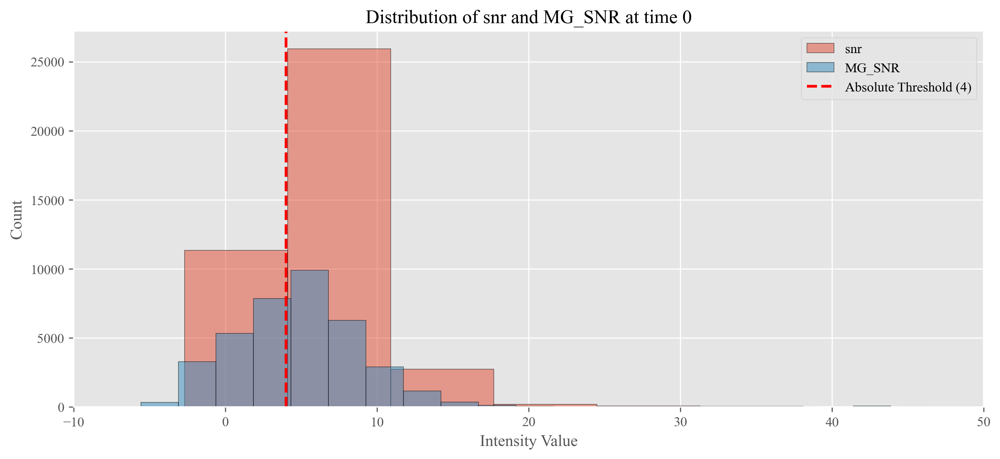

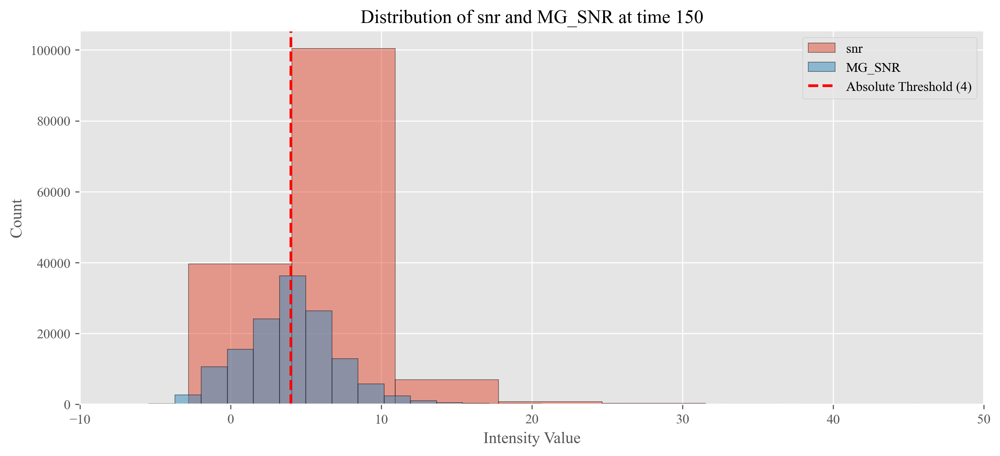

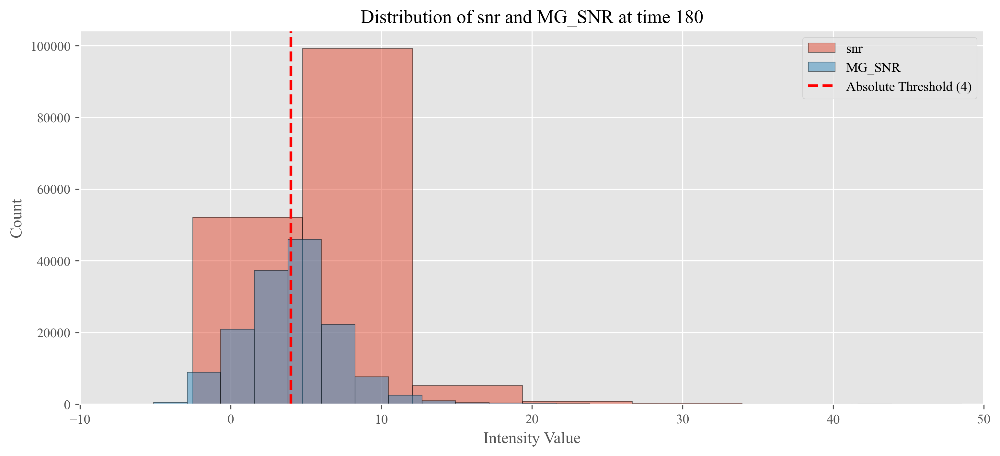

In [11]:
# Get the unique time points and sort them.
unique_times = sorted(merged_spots_df['time'].unique())

for t in unique_times:
    subset = merged_spots_df[merged_spots_df['time'] == t]
    plt.figure(figsize=(12, 5))
    plt.hist(subset['snr'], bins=50, alpha=0.5, edgecolor='black', label='snr')
    plt.hist(subset['MG_SNR'], bins=50, alpha=0.5, edgecolor='black', label='MG_SNR')
    plt.axvline(4, color='red', linestyle='dashed', linewidth=2, label='Absolute Threshold (4)')
    plt.title(f'Distribution of snr and MG_SNR at time {t}')
    plt.xlabel('Intensity Value')
    plt.xlim(-10, 50)
    plt.ylabel('Count')
    plt.legend()
    plt.show()

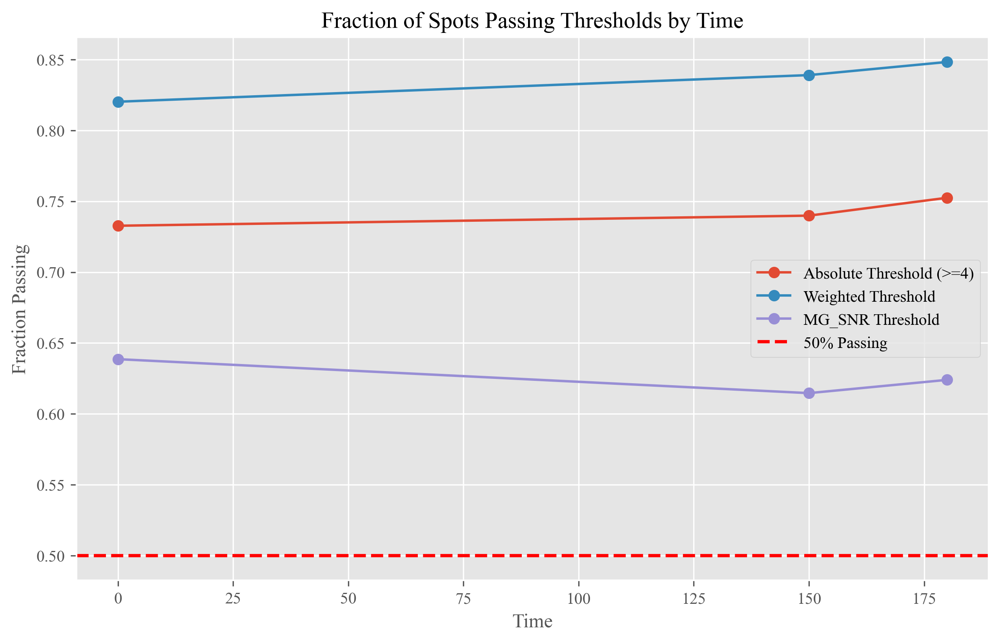

In [12]:
# Group by time_x and calculate the fraction passing each threshold.
time_groups = merged_spots_df.groupby('time')
abs_fraction = time_groups['absolute'].mean()  # True = 1, so the mean is the fraction passing.
weighted_fraction = time_groups['weighted'].mean()
mg_fraction = time_groups['MG_pass'].mean()

plt.figure(figsize=(10, 6))
plt.plot(abs_fraction.index, abs_fraction, marker='o', label='Absolute Threshold (>=4)')
plt.plot(weighted_fraction.index, weighted_fraction, marker='o', label='Weighted Threshold')
plt.plot(mg_fraction.index, mg_fraction, marker='o', label='MG_SNR Threshold')
plt.axhline(0.5, color='red', linestyle='dashed', linewidth=2, label='50% Passing')
plt.title('Fraction of Spots Passing Thresholds by Time')
plt.xlabel('Time')
plt.ylabel('Fraction Passing')
plt.legend()
plt.show()

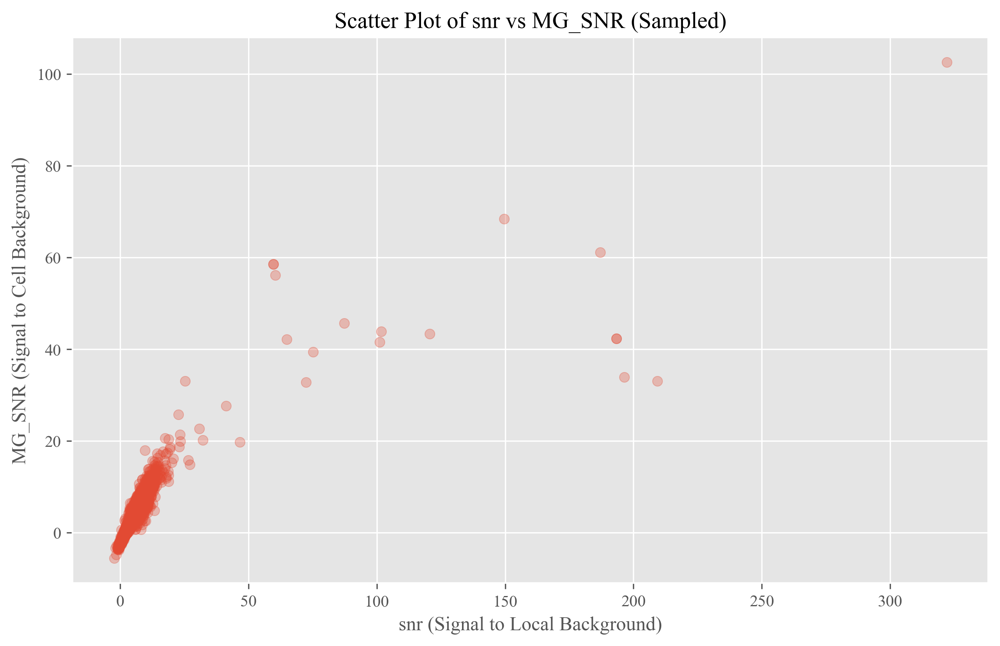

In [13]:
# Sample up to 1000 spots per time point for visualization.
sampled_df = merged_spots_df.groupby('time', group_keys=False).apply(lambda x: x.sample(min(1000, len(x))))

plt.figure(figsize=(10, 6))
plt.scatter(sampled_df['snr'], sampled_df['MG_SNR'], alpha=0.3)
plt.xlabel('snr (Signal to Local Background)')
plt.ylabel('MG_SNR (Signal to Cell Background)')
plt.title('Scatter Plot of snr vs MG_SNR (Sampled)')
plt.show()

In [14]:
# Create an instance of the DUSP1Measurement class.
dusp = DUSP1Measurement(merged_spots_df, merged_clusters_df, merged_cellprops_df)

# Process the data with a chosen SNR threshold 
cell_level_results = dusp.measure(snr_threshold=4, mg_threshold=mg_threshold)

# Now cell_level_results is a cell-level dataframe that you can use for comparisons,
# downstream analysis, or plotting with your preferred tools.
print(cell_level_results.head())

   unique_cell_id  weighted_count  nuc_weighted_count  cyto_weighted_count  \
0               0             216                  87                  129   
1               1             138                  44                   94   
2               2             213                 119                   94   
3               3              41                  19                   22   
4               4              53                  17                   36   

   absolute_count  nuc_absolute_count  cyto_absolute_count  MG_count  \
0             192                  74                  118       179   
1             122                  42                   80       116   
2             180                 103                   77       159   
3              34                  17                   17        33   
4              32                  12                   20        29   

   nuc_MG_count  cyto_MG_count  ...  avg_cyto_int  avg_cell_int  std_cell_int  \
0            64  

In [15]:
# Filter out partial cells and spots that are not passing the SNR threshold method.
filtering = DUSP1_filtering(method='MG')
filtered_cell_level_results = filtering.apply(cell_level_results)
filtered_spots, removed_spots = filtering.apply_spots(merged_spots_df, results=filtered_cell_level_results)
filtered_clusters, filtered_cellprops = filtering.remove_partial_cells(merged_clusters_df, merged_cellprops_df)

In [16]:
# Check the keys of the filtered dataframes.
filtered_cell_level_results.keys()
filtered_spots.keys()
filtered_clusters.keys()
filtered_cellprops.keys()
# Check the number of spots before and after filtering.
print("Number of spots before filtering:", merged_spots_df.shape[0])
print("Number of spots after filtering:", filtered_spots.shape[0])
print("Number of spots removed:", removed_spots.shape[0])
# Check the number of cells before and after filtering.
print("Number of cells before filtering:", merged_cellprops_df.shape[0])
print("Number of cells after filtering:", filtered_cellprops.shape[0])
# Check the number of clusters before and after filtering.
print("Number of clusters before filtering:", merged_clusters_df.shape[0])
print("Number of clusters after filtering:", filtered_clusters.shape[0])
# Check the number of cells that were removed.
print("Number of cells removed:", merged_cellprops_df.shape[0] - filtered_cellprops.shape[0])
# Check the number of clusters that were removed.
print("Number of clusters removed:", merged_clusters_df.shape[0] - filtered_clusters.shape[0])
# Check the number of spots that were removed.
print("Number of spots removed:", merged_spots_df.shape[0] - filtered_spots.shape[0])

Number of spots before filtering: 348508
Number of spots after filtering: 151147
Number of spots removed: 71067
Number of cells before filtering: 2046
Number of cells after filtering: 1170
Number of clusters before filtering: 1024
Number of clusters after filtering: 764
Number of cells removed: 876
Number of clusters removed: 260
Number of spots removed: 197361


In [21]:
# Define the output directory
output_dir = f'/Users/ericron/Desktop/AngelFISH/Publications/Ron_2024/dataframes'
os.makedirs(output_dir, exist_ok=True)

# Save filtered dataframes to CSV with today's date in the filename.
filtered_cell_level_results.to_csv(os.path.join(output_dir,f'DUSP1_M_cell_level_results_{date_str}_filtered_MG{mg_threshold}.csv'))
filtered_spots.to_csv(os.path.join(output_dir,f'DUSP1_M_merged_spots_{date_str}_filtered_MG{mg_threshold}.csv'))
removed_spots.to_csv(os.path.join(output_dir,f'DUSP1_M_merged_spots_{date_str}_removed_MG{mg_threshold}.csv'))
filtered_clusters.to_csv(os.path.join(output_dir,f'DUSP1_M_merged_clusters_{date_str}_filtered_MG{mg_threshold}.csv'))
filtered_cellprops.to_csv(os.path.join(output_dir,f'DUSP1_M_merged_cellprops_{date_str}_filtered_MG{mg_threshold}.csv'))

In [18]:
# # Load in csv files
# filtered_cell_level_results = pd.read_csv('/Users/ericron/Desktop/AngelFISH/Publications/Ron_2024/dataframes/DUSP1_M_cell_level_results_Apr18_filtered.csv')
# filtered_spots = pd.read_csv('/Users/ericron/Desktop/AngelFISH/Publications/Ron_2024/dataframes/DUSP1_M_merged_spots_Apr18_filtered.csv')
# removed_spots = pd.read_csv('/Users/ericron/Desktop/AngelFISH/Publications/Ron_2024/dataframes/DUSP1_M_merged_spots_Apr18_removed.csv')
# filtered_clusters = pd.read_csv('/Users/ericron/Desktop/AngelFISH/Publications/Ron_2024/dataframes/DUSP1_M_merged_clusters_Apr18_filtered.csv')
# filtered_cellprops = pd.read_csv('/Users/ericron/Desktop/AngelFISH/Publications/Ron_2024/dataframes/DUSP1_M_merged_cellprops_Apr18_filtered.csv')

Reference (control) data sample:
     unique_cell_id  touching_border  MG_count  nuc_MG_count  cyto_MG_count  \
666             666            False        21             5             16   
667             667            False        20             5             15   
668             668            False        24             9             15   
669             669            False        18             4             14   
670             670            False        13             5              8   

     num_ts  num_foci  num_spots_foci  num_spots_ts  largest_ts  ...  \
666       0         0               0             0           0  ...   
667       0         0               0             0           0  ...   
668       0         0               0             0           0  ...   
669       0         0               0             0           0  ...   
670       0         0               0             0           0  ...   

     avg_nuc_int  avg_cyto_int  avg_cell_int  std_cell_int 

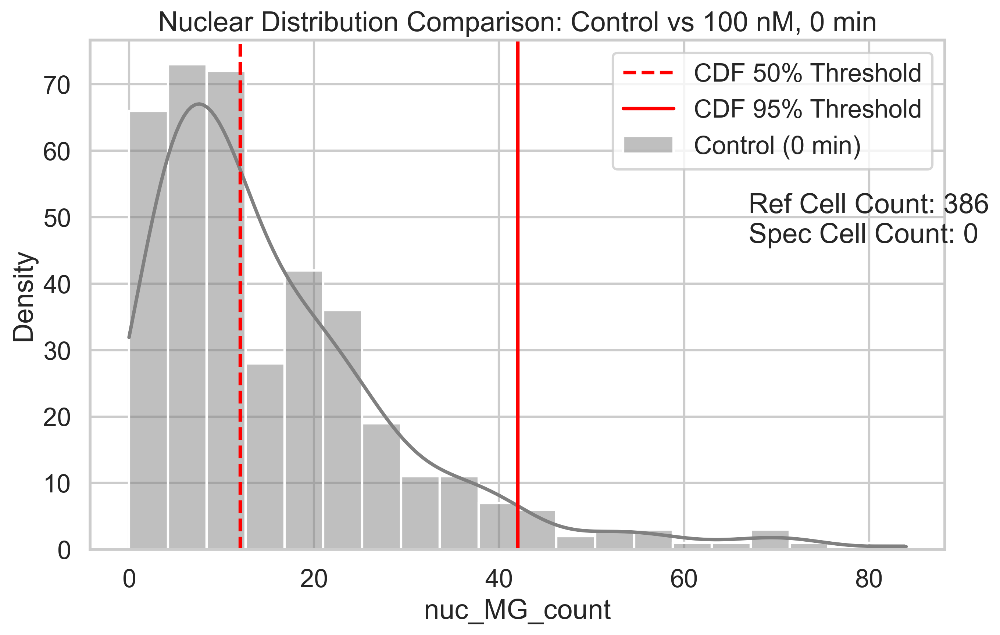

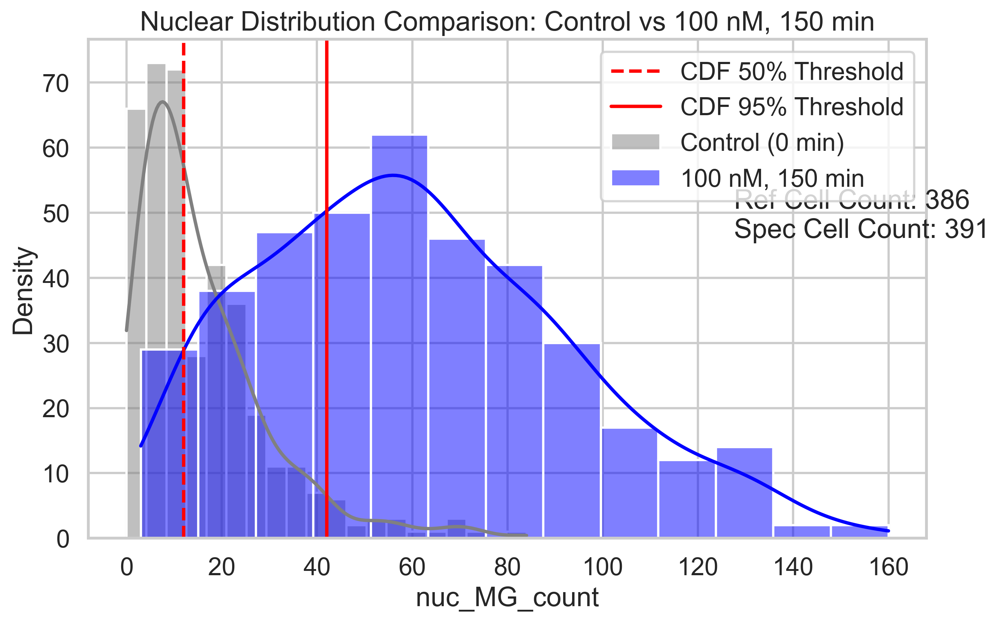

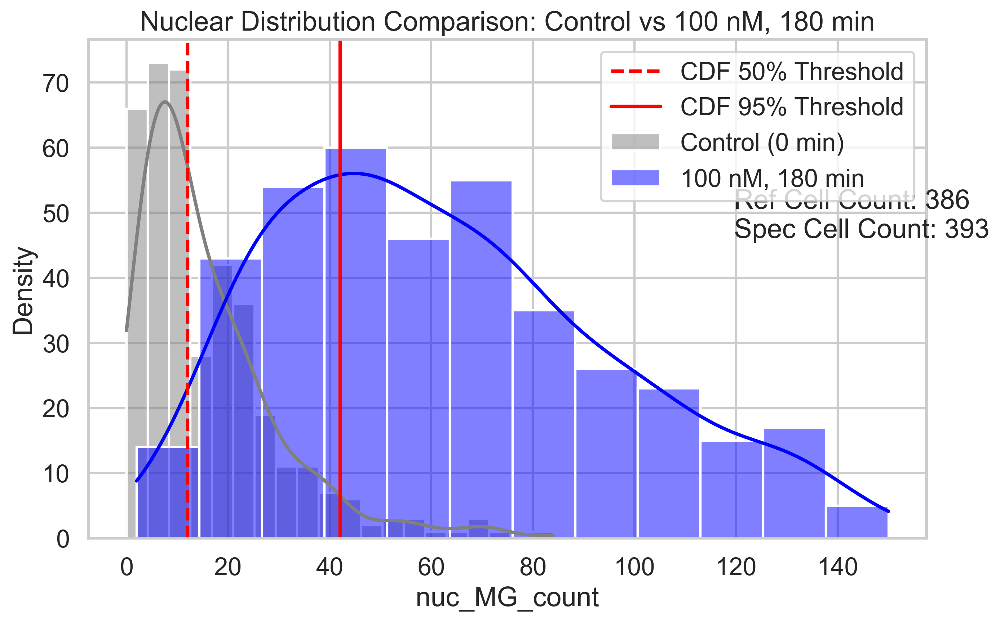

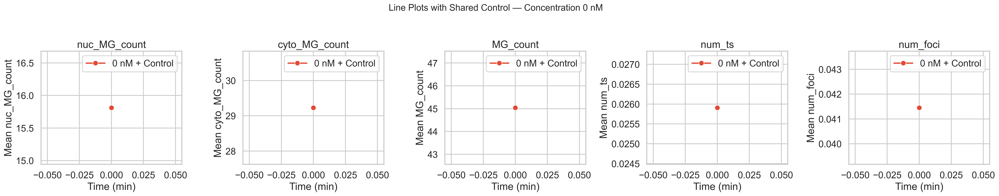

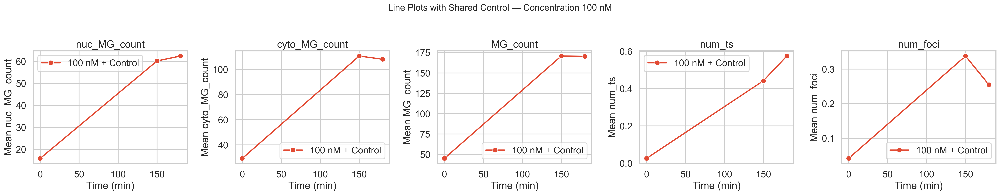

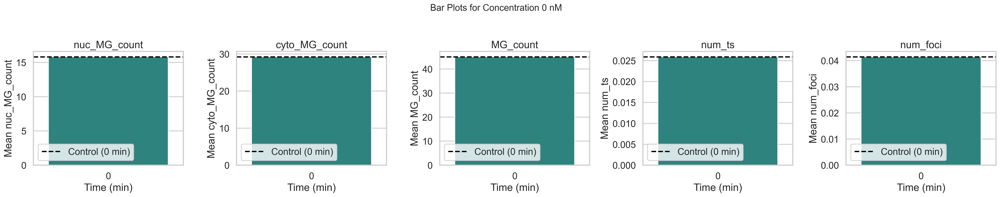

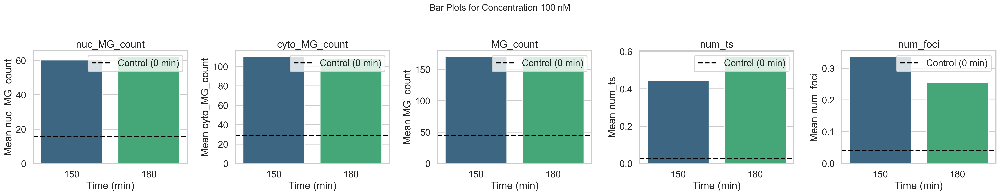

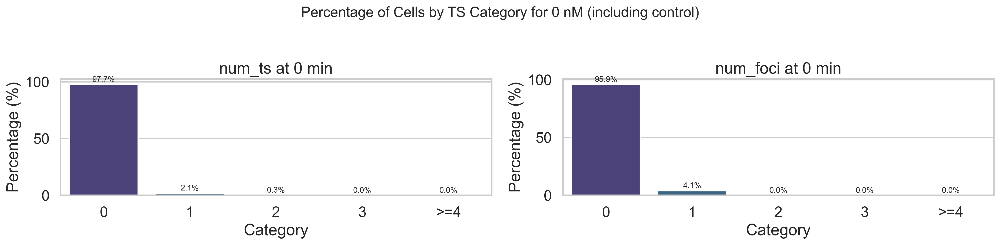

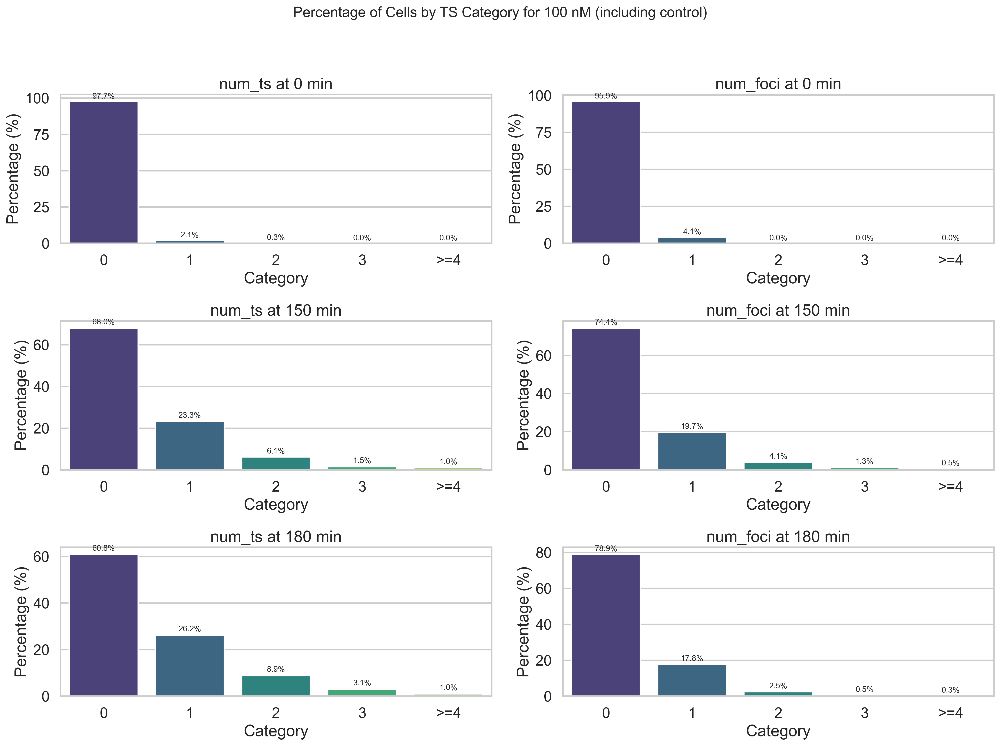

In [19]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# ============================================================================
# Settings and Data
# ============================================================================
metrics = ['nuc_MG_count', 'cyto_MG_count', 'MG_count', 'num_ts', 'num_foci']

# Sorted unique values for concentrations and time
concentrations = sorted(filtered_cell_level_results['dex_conc'].unique())
timepoints = sorted(filtered_cell_level_results['time'].unique())

# Set common aesthetics
sns.set_context('talk')
sns.set_style('whitegrid')

# Make a copy of the main dataframe
df = filtered_cell_level_results.copy()

# ============================================================================
# Get the control (baseline) data: all rows with time == 0.
# ============================================================================
reference_data = df[df['time'] == 0]
print("Reference (control) data sample:")
print(reference_data.head())

# For the histograms below, we also calculate CDF thresholds based on one metric.
# (In this example, we use 'nuc_MG_count'; update as needed for other metrics.)
cdf_values = np.sort(reference_data['nuc_MG_count'])
cdf = np.arange(1, len(cdf_values) + 1) / len(cdf_values)
cdf_50_threshold = np.interp(0.50, cdf, cdf_values)
cdf_95_threshold = np.interp(0.95, cdf, cdf_values)

# Define the concentrations and desired timepoints for the histograms (e.g., concentration 100 only)
concentrations_to_plot = [100]  # modify as needed
desired_timepoints = timepoints


# ============================================================================
# 1. HISTOGRAMS
# For each desired timepoint and concentration, compare the histogram for the 
# experimental condition (given dex_conc and time) with the control (time==0) data.
# ============================================================================
for time in desired_timepoints:
    for dex_conc in concentrations_to_plot:
        plt.figure(figsize=(10, 6))
        specific_data = df[(df['dex_conc'] == dex_conc) & (df['time'] == time)]
        
        sns.histplot(reference_data['nuc_MG_count'], color='grey', label='Control (0 min)', kde=True)
        sns.histplot(specific_data['nuc_MG_count'], color='blue', label=f'{dex_conc} nM, {time} min', kde=True)
        
        plt.axvline(cdf_50_threshold, color='red', linestyle='--', label='CDF 50% Threshold')
        plt.axvline(cdf_95_threshold, color='red', linestyle='-',  label='CDF 95% Threshold')
        
        plt.annotate(f'Ref Cell Count: {len(reference_data)}\nSpec Cell Count: {len(specific_data)}',
                     xy=(0.77, 0.70), xycoords='axes fraction', verticalalignment='top')
        plt.title(f'Nuclear Distribution Comparison: Control vs {dex_conc} nM, {time} min')
        plt.xlabel('nuc_MG_count')
        plt.ylabel('Density')
        plt.legend()
        plt.show()


# ============================================================================
# 2. LINE PLOTS (with control overlay)
# For each concentration, plot the mean metric value over time
# and overlay a horizontal dashed line indicating the control (0 min) mean.
# ============================================================================
for conc in concentrations:
    fig, axes = plt.subplots(1, len(metrics), figsize=(5 * len(metrics), 5))
    fig.suptitle(f'Line Plots with Shared Control — Concentration {conc} nM', fontsize=16)

    # Experimental data for this concentration
    data_conc = df[df['dex_conc'] == conc]

    # Control data (baseline): dex_conc == 0 and time == 0
    control_data = df[(df['dex_conc'] == 0) & (df['time'] == 0)]

    for i, metric in enumerate(metrics):
        ax = axes[i]

        # Experimental mean metric over time
        grouped_exp = data_conc.groupby('time')[metric].mean().reset_index()

        # Add baseline mean as the 0 min point
        if not control_data.empty:
            control_mean = control_data[metric].mean()
            # Create a new row at time=0
            control_point = pd.DataFrame({'time': [0], metric: [control_mean]})
            # Concatenate with experimental data
            combined = pd.concat([control_point, grouped_exp], ignore_index=True)
        else:
            combined = grouped_exp.copy()

        sns.lineplot(data=combined, x='time', y=metric, marker='o', ax=ax, label=f'{conc} nM + Control')

        ax.set_title(metric)
        ax.set_xlabel('Time (min)')
        ax.set_ylabel(f'Mean {metric}')
        ax.legend()

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


# ============================================================================
# 3. BAR PLOTS (with control overlay)
# For each concentration, plot a bar chart displaying the mean metric value at each timepoint
# and overlay a horizontal dashed line indicating the control (0 min) mean.
# ============================================================================
for conc in concentrations:
    fig, axes = plt.subplots(1, len(metrics), figsize=(5 * len(metrics), 5))
    fig.suptitle(f'Bar Plots for Concentration {conc} nM', fontsize=16)
    
    # Data for this concentration
    data_conc = df[df['dex_conc'] == conc]
    
    for i, metric in enumerate(metrics):
        ax = axes[i]
        df_grouped = data_conc.groupby('time')[metric].mean().reset_index()
        sns.barplot(data=df_grouped, x='time', y=metric, ax=ax, palette='viridis')
        
        # Compute control mean from reference
        control_mean = reference_data[metric].mean()
        ax.axhline(control_mean, color='black', linestyle='--', label='Control (0 min)')
        
        ax.set_title(metric)
        ax.set_xlabel('Time (min)')
        ax.set_ylabel(f'Mean {metric}')
        ax.legend()
    
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


# ============================================================================
# 4. CATEGORY-BASED BAR PLOTS FOR 'num_ts' and 'num_foci'
# For each concentration, display for each timepoint the fraction (percentage) of cells 
# falling into the categories "0", "1", "2", "3", or ">=4".
# Now baseline (control) data is included by concatenating the control data.
# ============================================================================
def cat_func(x):
    if x == 1:
        return '1'
    elif x == 2:
        return '2'
    elif x == 3:
        return '3'
    elif x >= 4:
        return '>=4'
    else:
        return '0'

cat_metrics = ['num_ts', 'num_foci']

for conc in concentrations:
    data_conc = df[df['dex_conc'] == conc]
    control_data = df[(df['time'] == 0) & (df['dex_conc'] == 0)]
    data_for_plot = pd.concat([control_data, data_conc], ignore_index=True)
    time_points = sorted(data_for_plot['time'].unique())

    fig, axes = plt.subplots(len(time_points), len(cat_metrics), 
                             figsize=(8 * len(cat_metrics), 4 * len(time_points)))

    # ---- MAKE AXES ALWAYS 2D ----
    if len(time_points) == 1 and len(cat_metrics) == 1:
        axes = np.array([[axes]])
    elif len(time_points) == 1:
        axes = np.expand_dims(axes, axis=0)
    elif len(cat_metrics) == 1:
        axes = np.expand_dims(axes, axis=1)
    # -----------------------------

    fig.suptitle(f'Percentage of Cells by TS Category for {conc} nM (including control)', fontsize=16)

    for row, t in enumerate(time_points):
        for col, metric in enumerate(cat_metrics):
            ax = axes[row][col]
            subset = data_for_plot[data_for_plot['time'] == t].copy()
            subset['category'] = subset[metric].apply(cat_func)

            counts = subset['category'].value_counts(normalize=True).sort_index() * 100
            categories = ['0', '1', '2', '3', '>=4']
            counts = counts.reindex(categories, fill_value=0)

            sns.barplot(x=counts.index, y=counts.values, ax=ax, palette='viridis')
            ax.set_title(f'{metric} at {t} min')
            ax.set_xlabel('Category')
            ax.set_ylabel('Percentage (%)')

            for i, v in enumerate(counts.values):
                ax.text(i, v + 1, f"{v:.1f}%", ha='center', va='bottom', fontsize=9)

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

Running display_gating_overlay...
Selected H5 Index: 0
Nas Location: smFISH_images/Eric_smFISH_images/20220725/DUSP1_Dex_100nM_6hr_150min_072022/DUSP1_Dex_100nM_6hr_150min_072022.h5
FOV: 37
Spots DataFrame: (1950, 25)
Cell Properties DataFrame: (12, 70)
Clusters DataFrame: (4, 25)


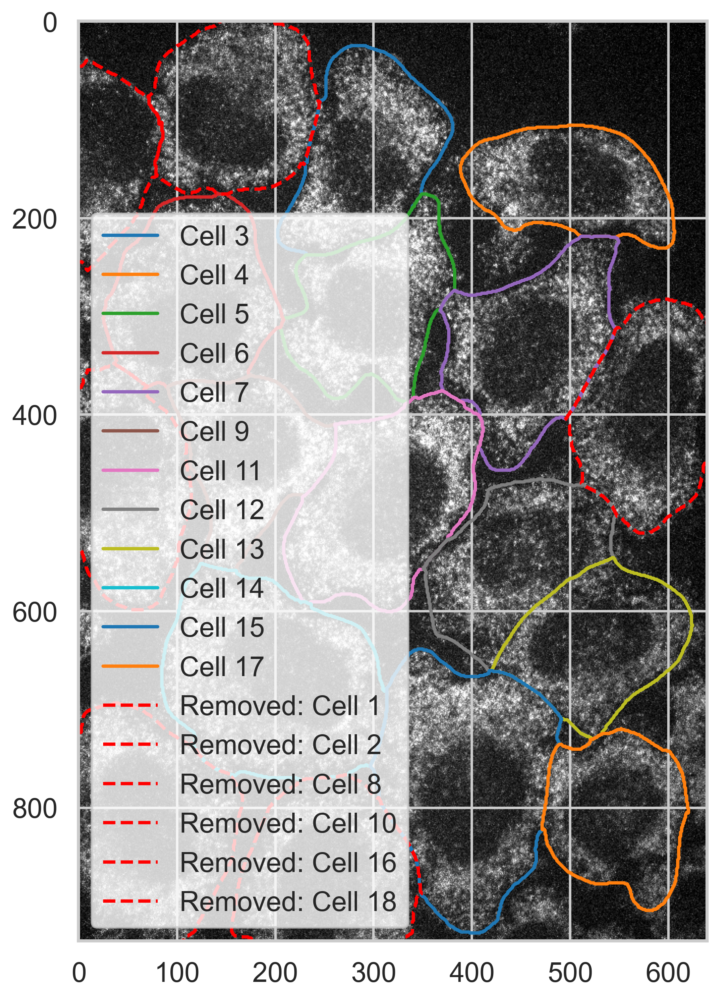

Running _display_zoom_on_cell...
Chose unique_cell_id=632.0 with TS and Spot (FOV=37).
No Foci in this cell


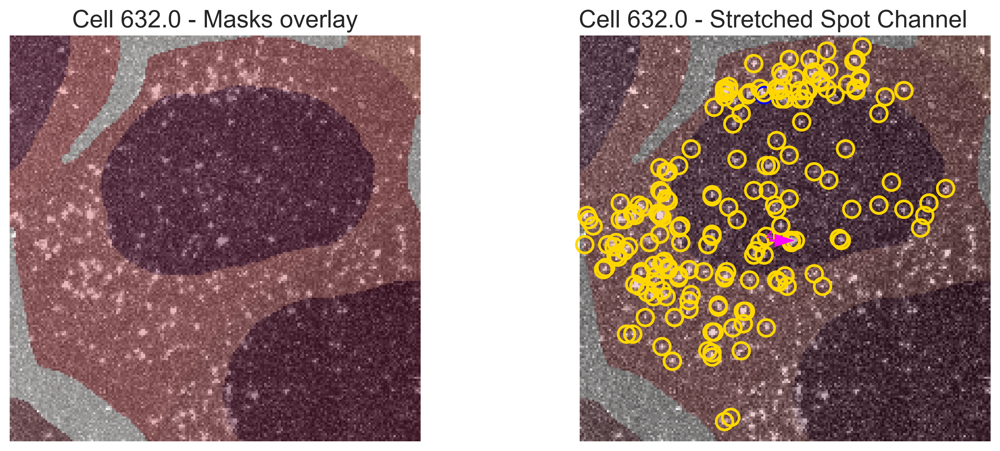

Running _display_zoom_on_one_spot...


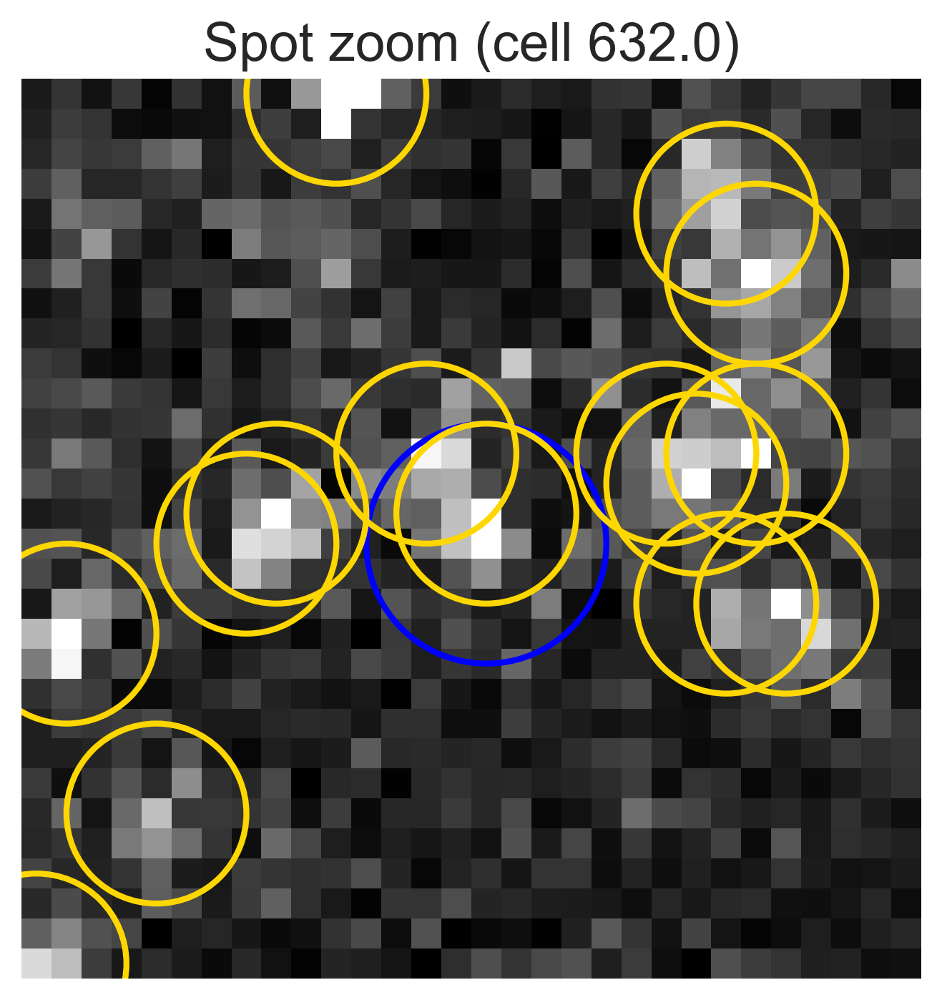

Running display_representative_cells...

Processing h5_idx 0
  Selected cell with removal 'High' from h5_idx 0.
    Displaying cell plot: NA_150_FOV20_ID333
Chose unique_cell_id=351.0 with TS, Foci, and Spot (FOV=20).


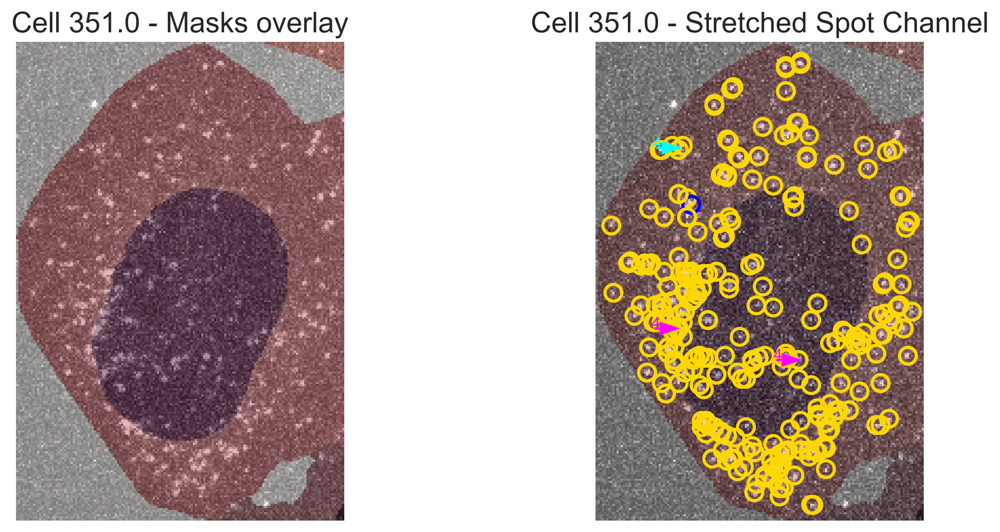

<Figure size 1920x1440 with 0 Axes>

    Displaying spot zoom for cell ID 333.


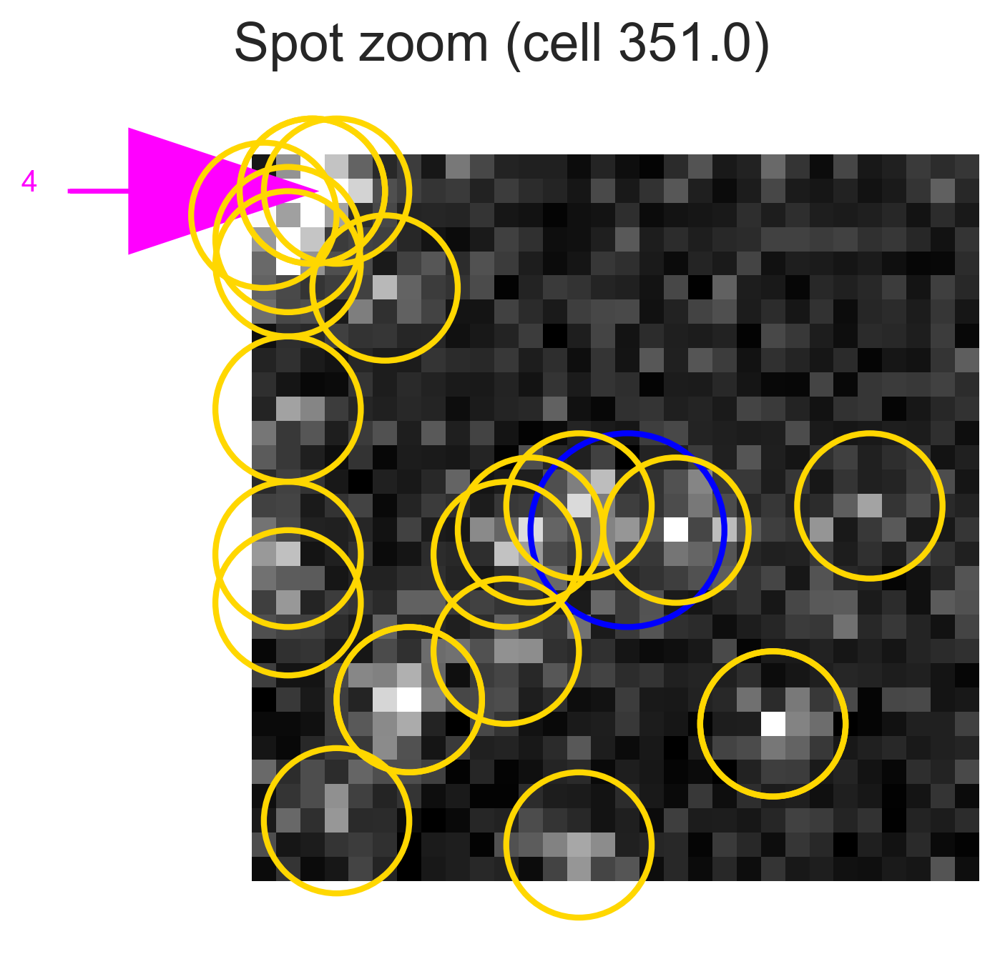

  Selected cell with removal 'Medium' from h5_idx 0.
    Displaying cell plot: NA_150_FOV12_ID220
Chose unique_cell_id=207.0 with TS, Foci, and Spot (FOV=12).


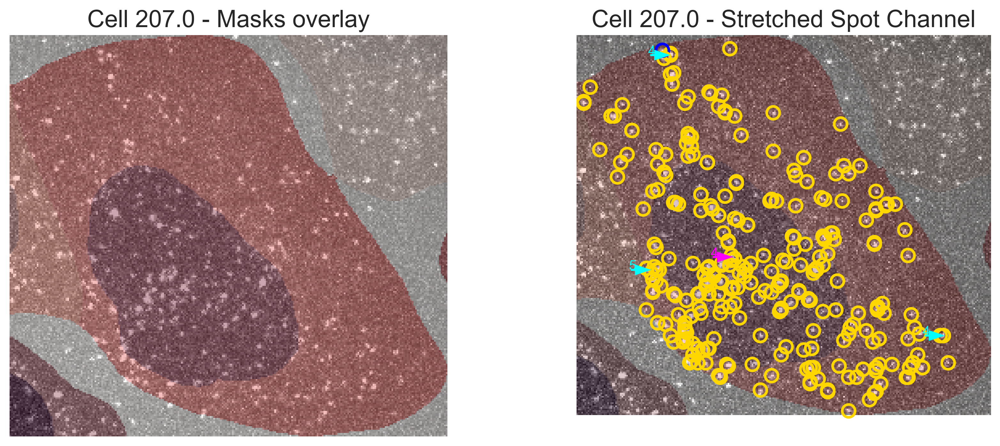

<Figure size 1920x1440 with 0 Axes>

    Displaying spot zoom for cell ID 220.


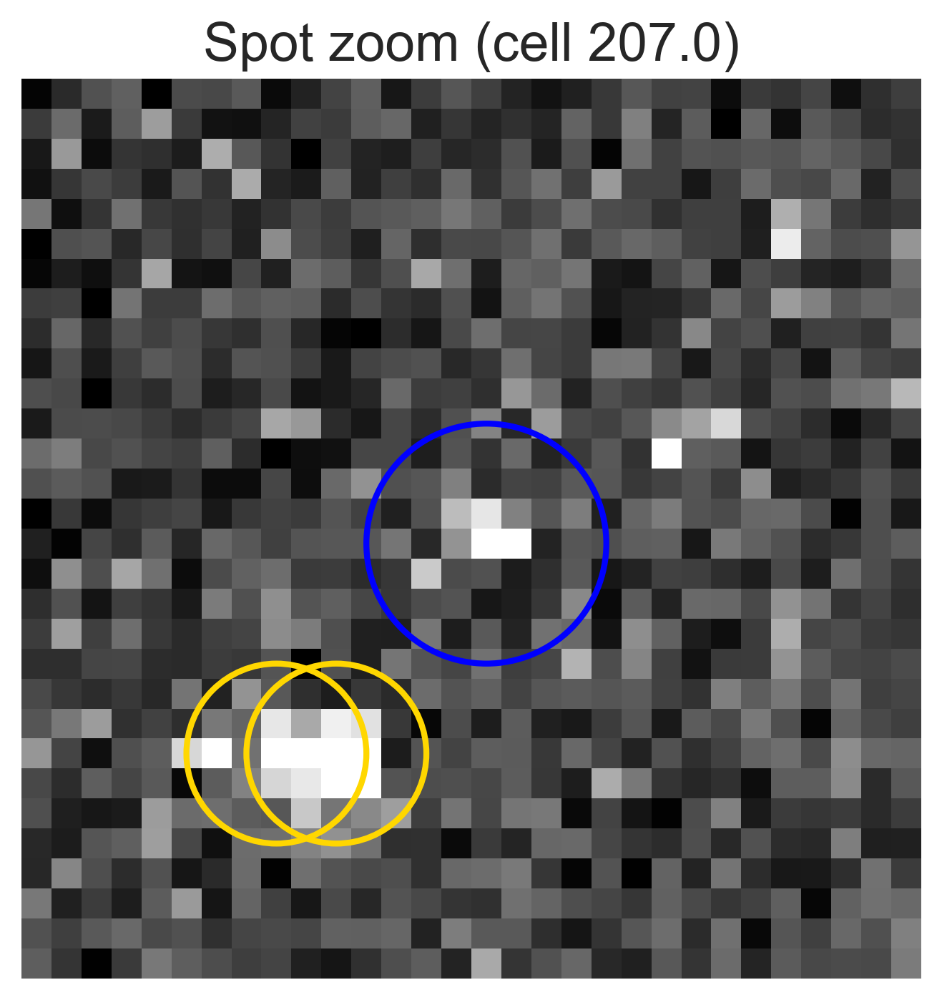

  Selected cell with removal 'Low' from h5_idx 0.
    Displaying cell plot: NA_150_FOV19_ID326
Chose unique_cell_id=326.0 with TS, Foci, and Spot (FOV=19).


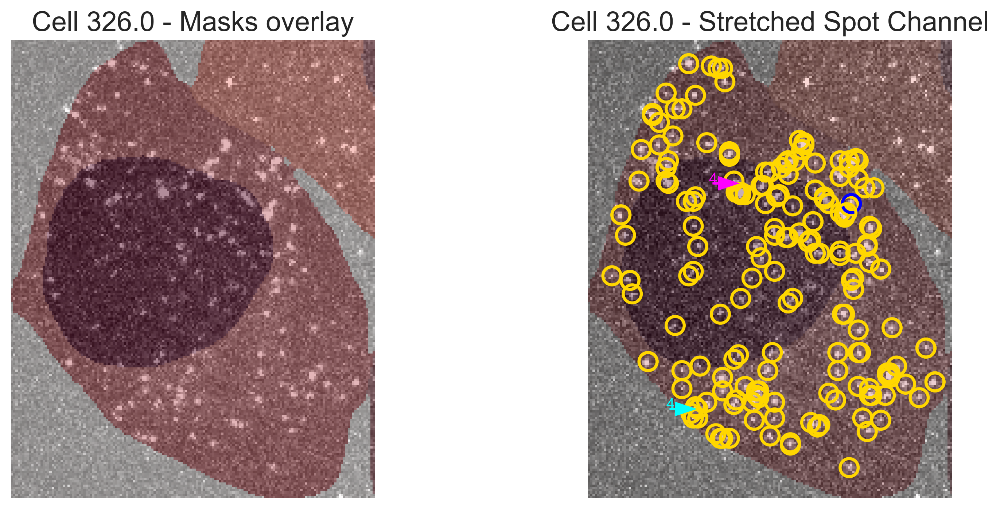

<Figure size 1920x1440 with 0 Axes>

    Displaying spot zoom for cell ID 326.


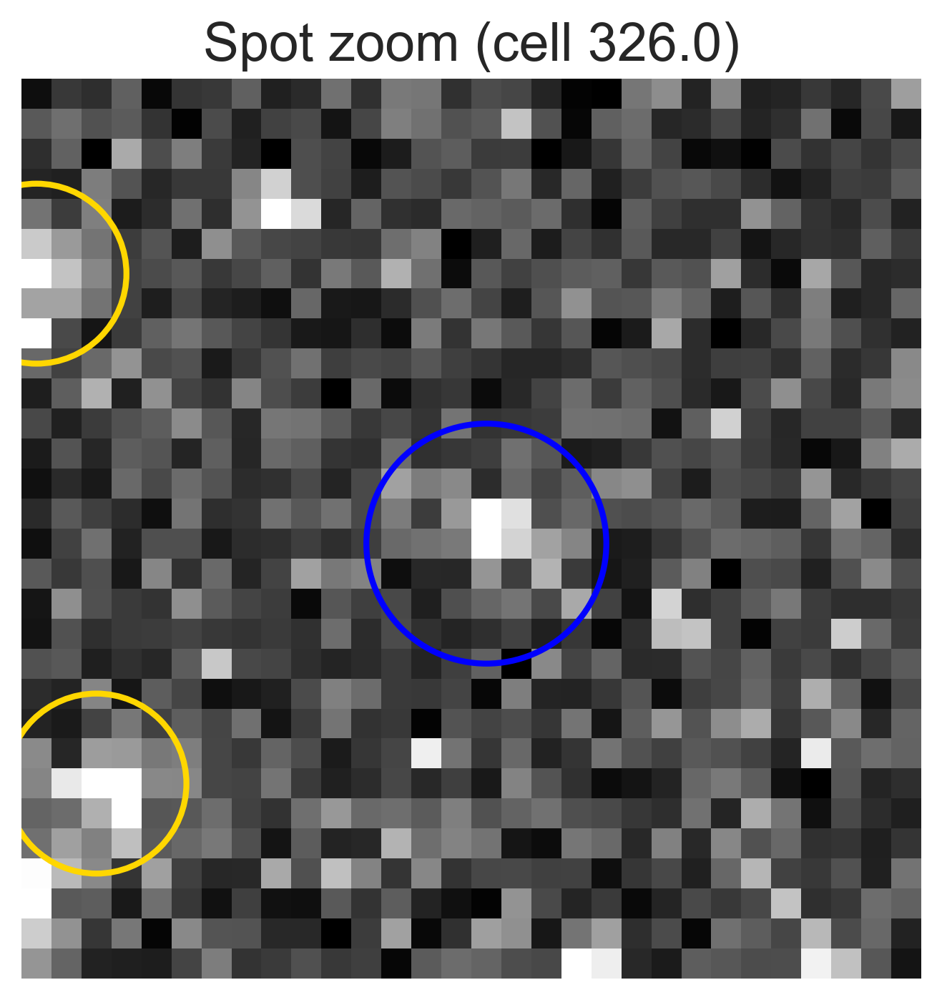


Processing h5_idx 1
  Selected cell with removal 'High' from h5_idx 1.
    Displaying cell plot: NA_0_FOV20_ID1000
Chose unique_cell_id=1001.0 with TS and Spot (FOV=20).
No Foci in this cell


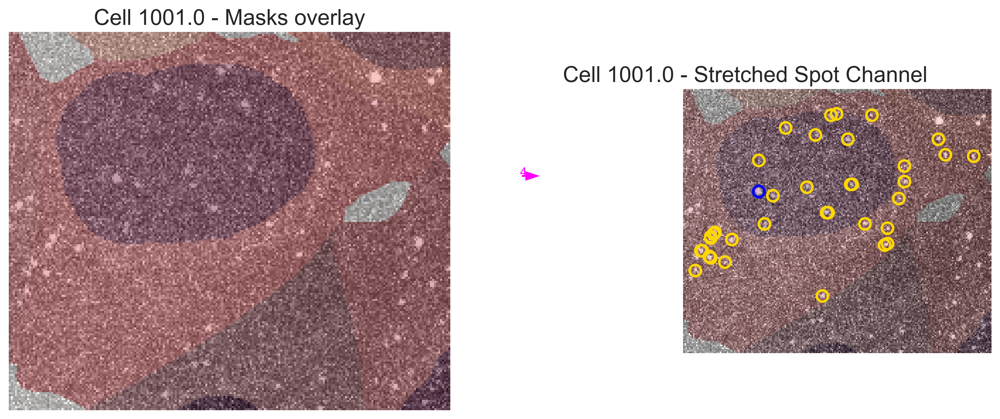

<Figure size 1920x1440 with 0 Axes>

    Displaying spot zoom for cell ID 1000.


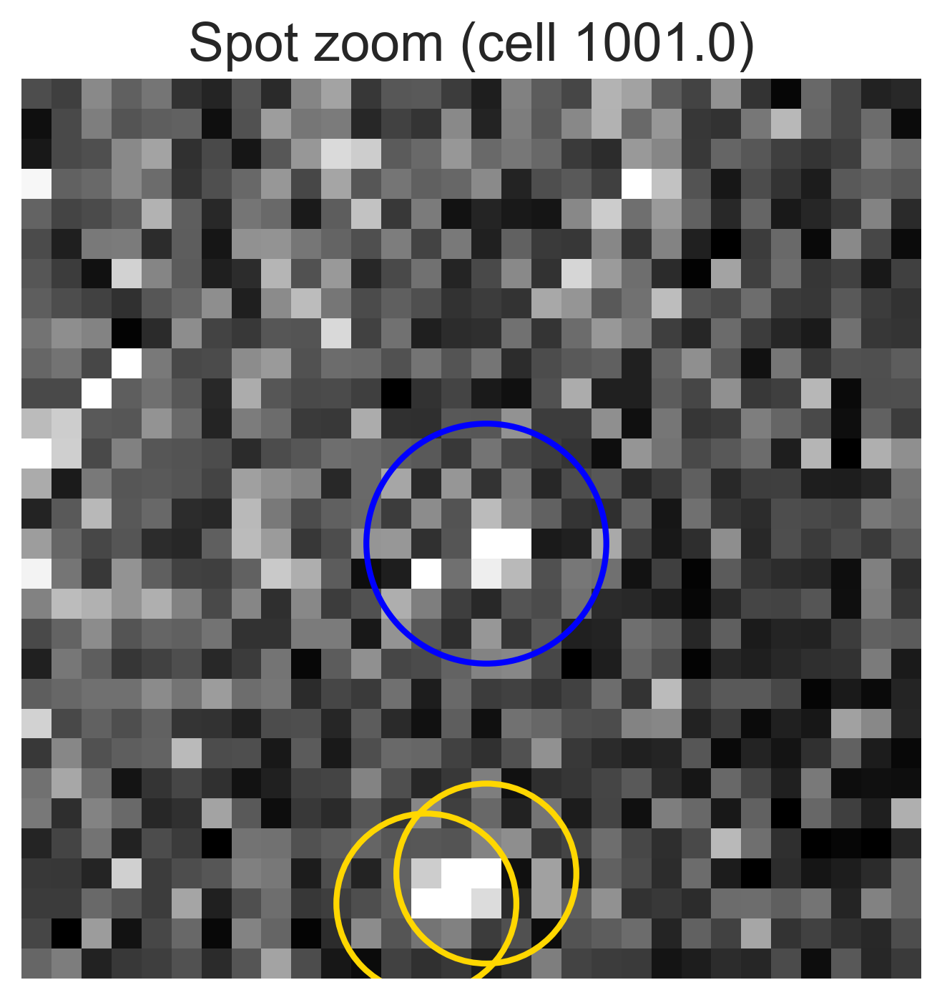

  Selected cell with removal 'Medium' from h5_idx 1.
    Displaying cell plot: NA_0_FOV32_ID1197
Chose unique_cell_id=1208.0 with TS and Spot (FOV=32).
No Foci in this cell


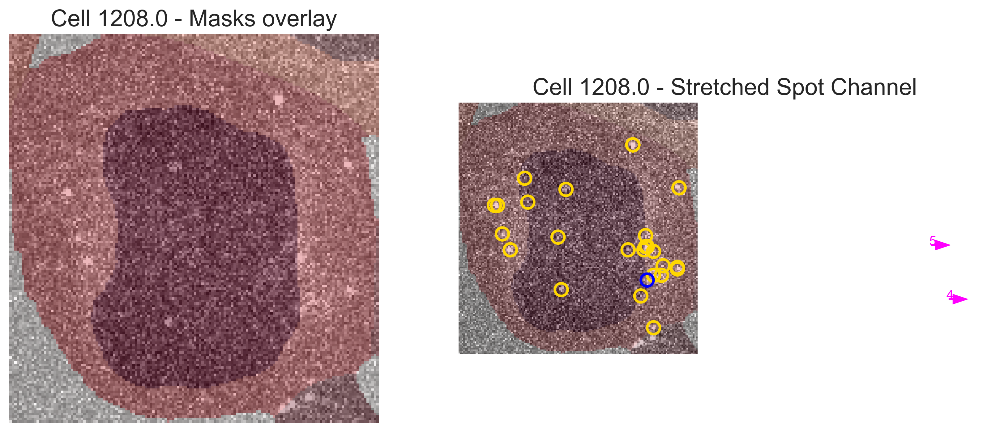

<Figure size 1920x1440 with 0 Axes>

    Displaying spot zoom for cell ID 1197.


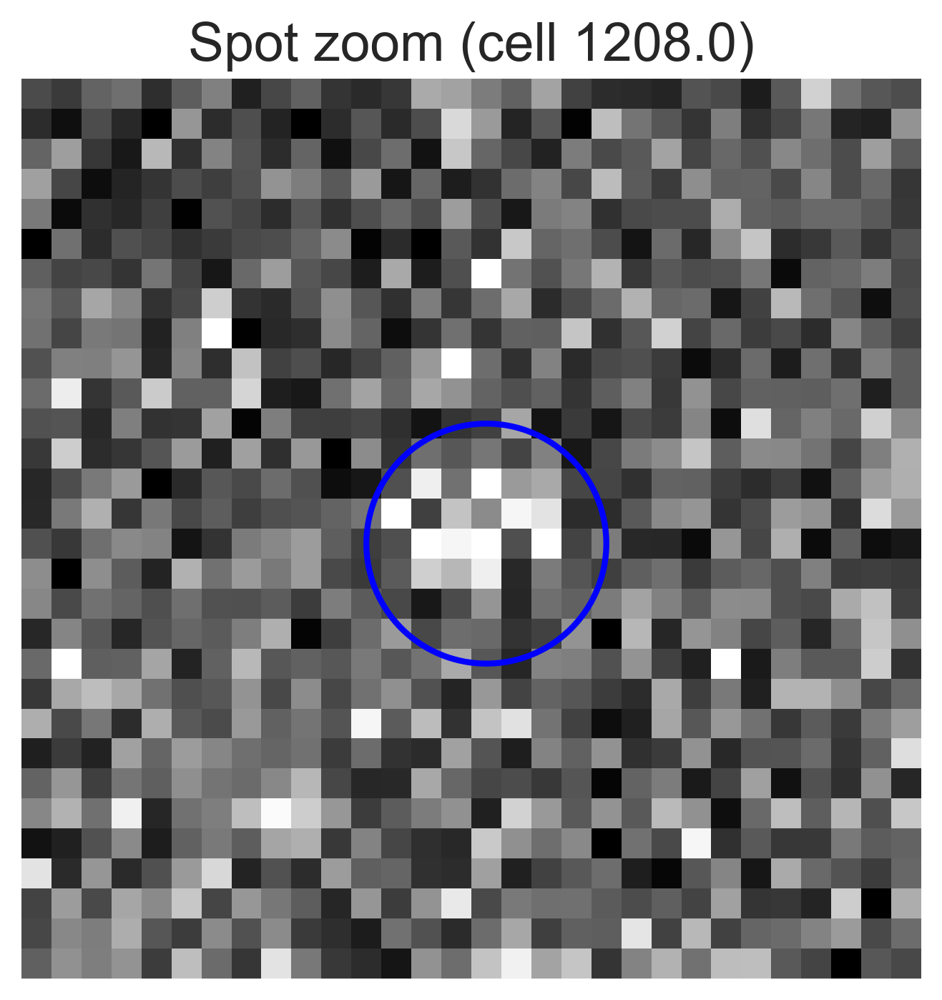

  Selected cell with removal 'Low' from h5_idx 1.
    Displaying cell plot: NA_0_FOV39_ID1333
Chose unique_cell_id=1326.0 with Spot only (FOV=39).
No Foci in this cell


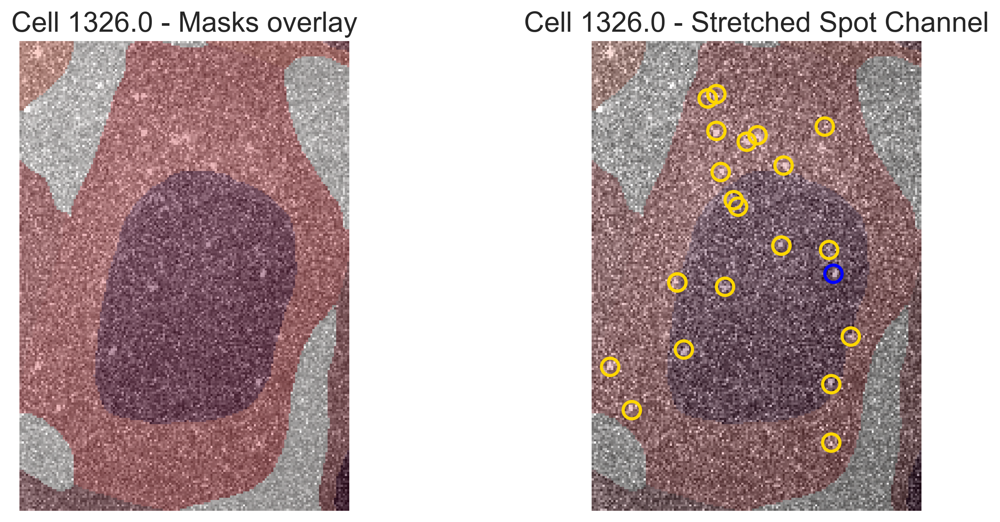

<Figure size 1920x1440 with 0 Axes>

    Displaying spot zoom for cell ID 1333.


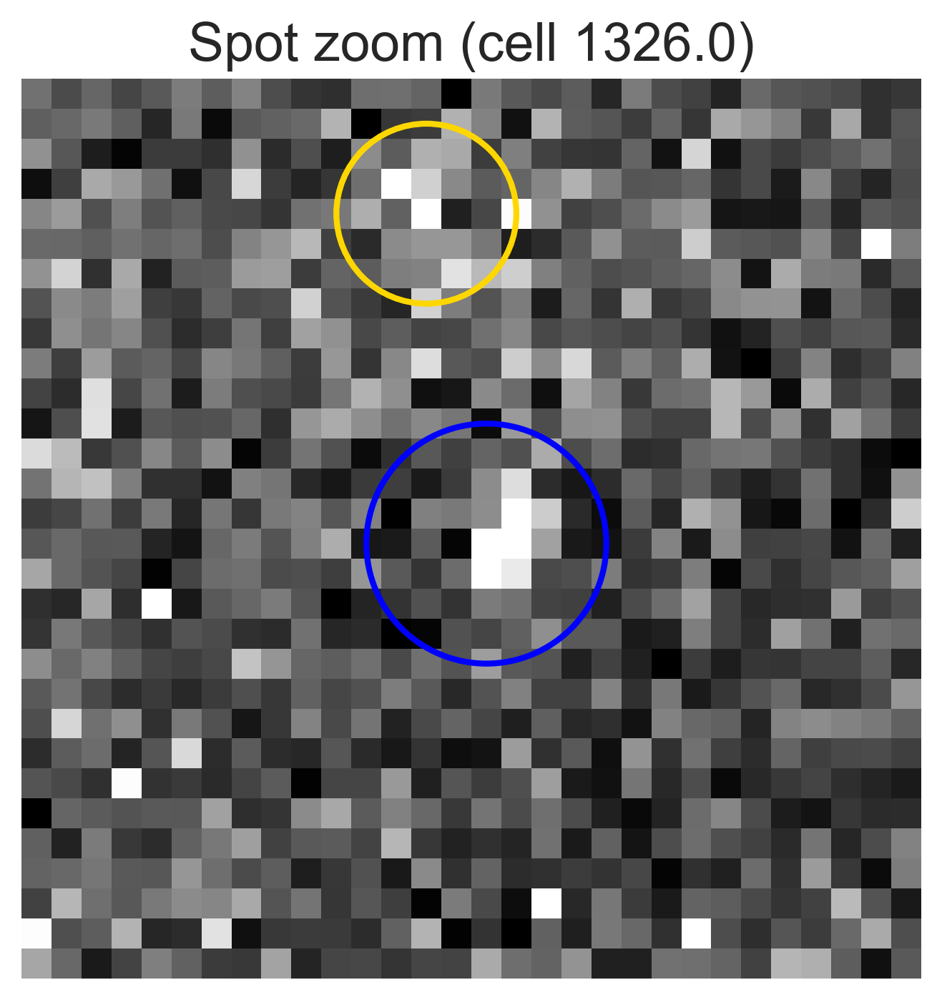


Processing h5_idx 2
  Selected cell with removal 'High' from h5_idx 2.
    Displaying cell plot: NA_180_FOV16_ID1636
Chose unique_cell_id=1647.0 with TS, Foci, and Spot (FOV=16).


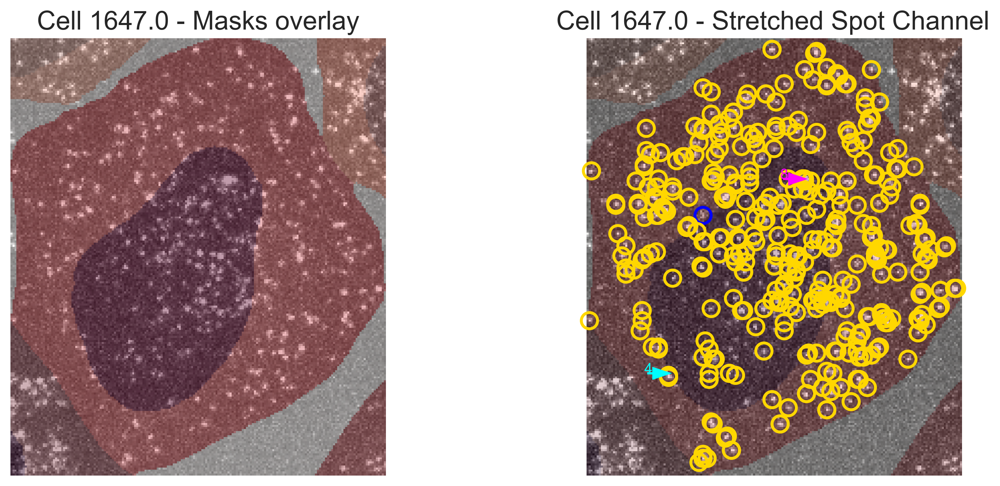

<Figure size 1920x1440 with 0 Axes>

    Displaying spot zoom for cell ID 1636.


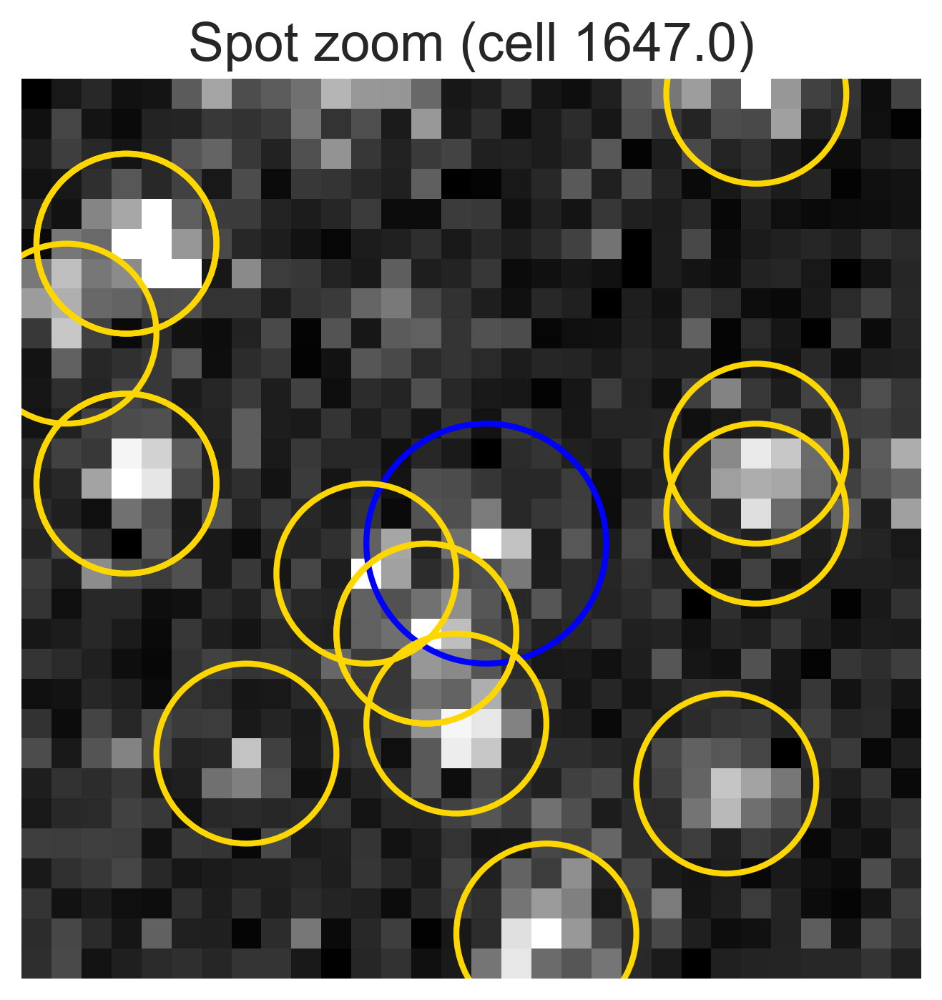

  Selected cell with removal 'Medium' from h5_idx 2.
    Displaying cell plot: NA_180_FOV22_ID1749
Chose unique_cell_id=1750.0 with TS, Foci, and Spot (FOV=22).


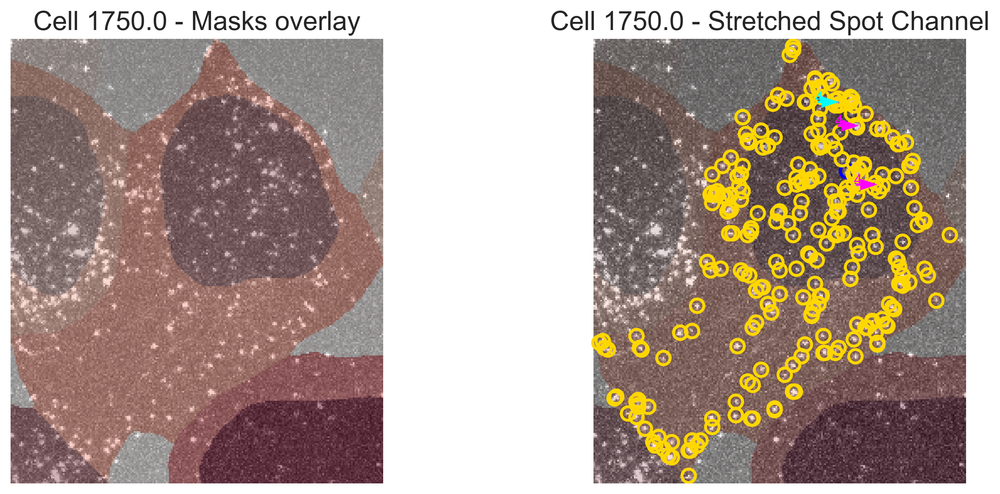

<Figure size 1920x1440 with 0 Axes>

    Displaying spot zoom for cell ID 1749.


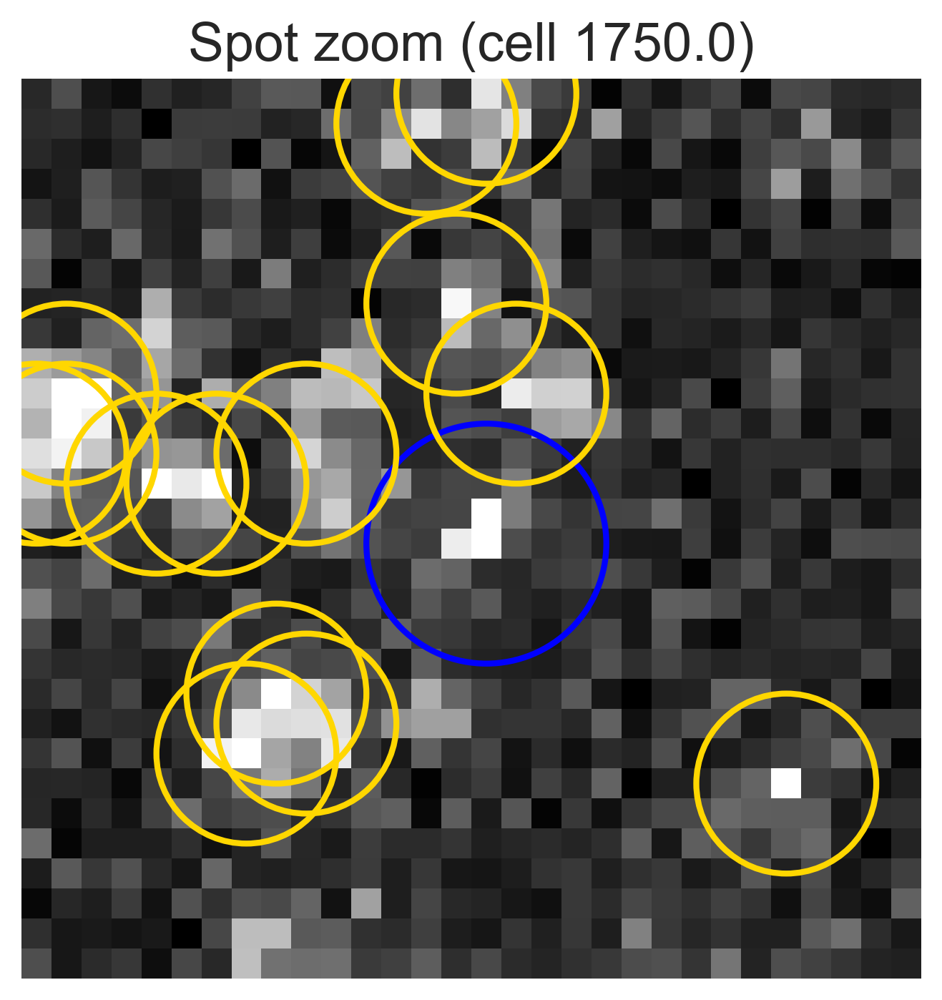

  Selected cell with removal 'Low' from h5_idx 2.
    Displaying cell plot: NA_180_FOV0_ID1353
Chose unique_cell_id=1353.0 with TS, Foci, and Spot (FOV=0).


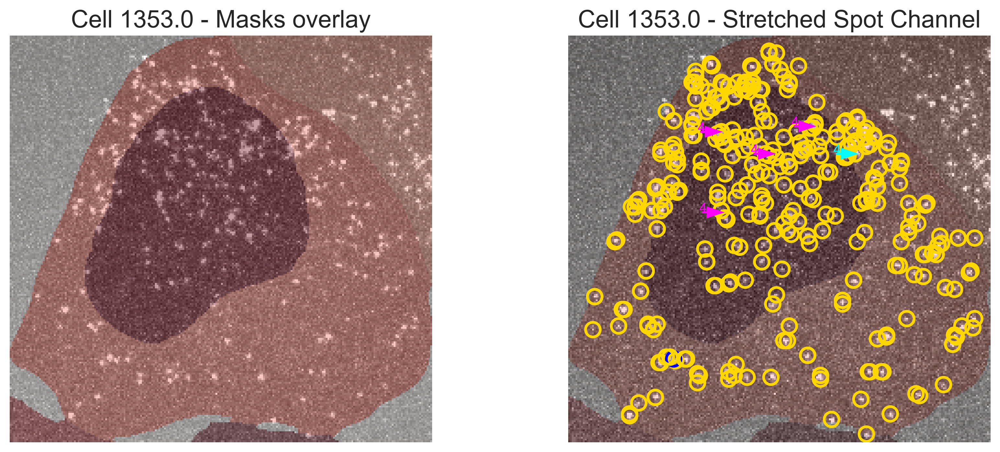

<Figure size 1920x1440 with 0 Axes>

    Displaying spot zoom for cell ID 1353.


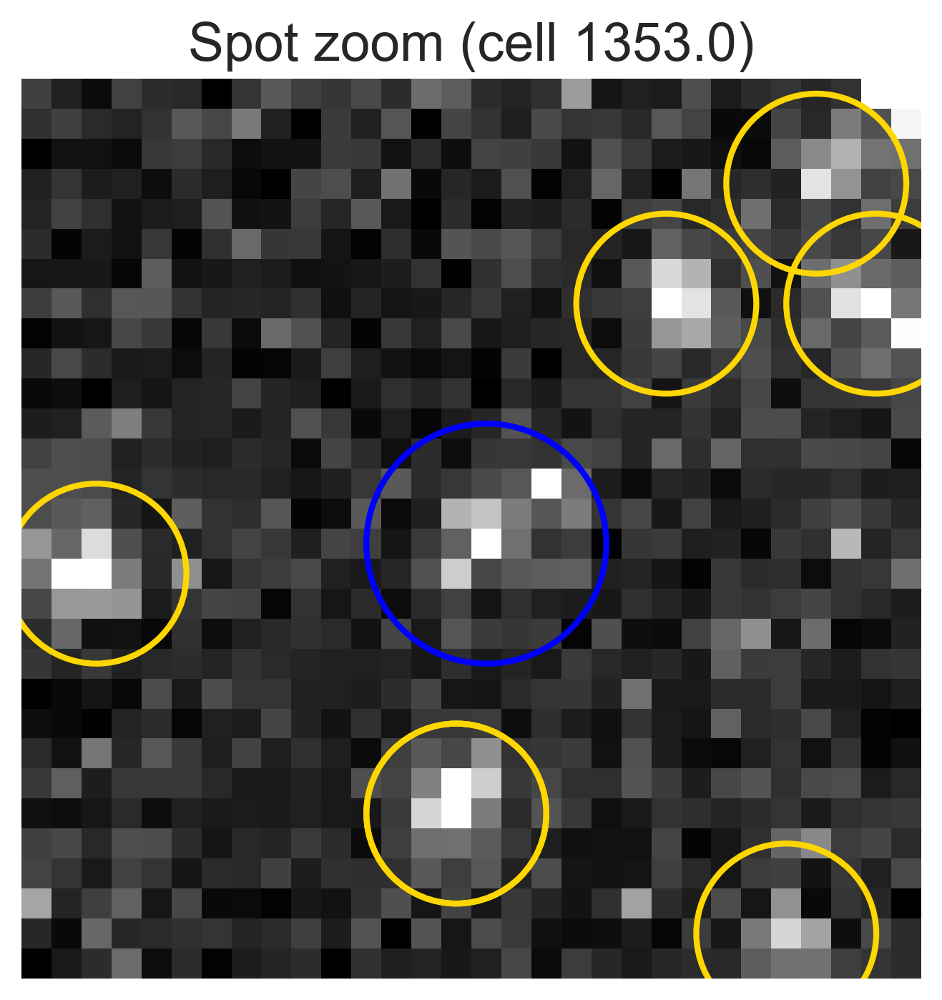

Running display_cell_TS_foci_variations...


In [20]:
am = DUSP1AnalysisManager(location=loc, log_location=log_location, mac=True)
am.select_analysis('DUSP1_M_Final')

display_manager = DUSP1DisplayManager(am, 
                                      cell_level_results=filtered_cell_level_results,
                                      spots=filtered_spots,
                                      clusters=filtered_clusters,
                                      cellprops=filtered_cellprops,
                                      method='MG',
                                      removed_spots=removed_spots)
# Run the main display function.
display_manager.main_display()